# Model building and predicting prices

## EDA and preprocessing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#!pip install pandas-profiling --user

In [3]:
import pandas_profiling as pp

In [4]:
df = pd.read_csv('price_train.csv')
df.head()

,X1,id,host_is_superhost,host_response_rate,host_response_time,host_listings_count,host_identity_verified,accommodates,neighbourhood_group_cleansed,property_type,...,bedrooms,beds,bed_type,amenities,cleaning_fee,minimum_nights,maximum_nights,instant_bookable,cancellation_policy,price
0,5460,22146017,False,99%,within an hour,521,False,5,Downtown,Apartment,...,2,2,Real Bed,"{TV,Internet,Wifi,Kitchen,Elevator,Heating,""Fa...",$129.00,2,1125,True,strict,$279.00
1,4143,18638163,True,100%,within an hour,1,True,2,Queen Anne,House,...,0,1,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$50.00,2,30,True,moderate,$99.00
2,5802,22734110,True,100%,within an hour,1,False,4,Rainier Valley,Guest suite,...,1,2,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Free stre...",$25.00,2,28,False,moderate,$75.00
3,776,3946674,True,90%,within a few hours,1,True,2,Central Area,House,...,1,1,Real Bed,"{Internet,Wifi,Kitchen,""Pets live on this prop...",$0.00,2,30,False,flexible,$70.00
4,6064,23610186,True,100%,within an hour,4,True,8,Beacon Hill,House,...,3,3,Real Bed,"{TV,Wifi,Kitchen,""Free parking on premises"",""S...",$99.00,2,12,False,flexible,$242.00


In [5]:
## Removing $ from prices and converting into float
df['price'] = df['price'].apply(lambda x: x.split('$')[1].replace(',', '')).astype(float)

In [6]:
df['host_response_rate'] = df['host_response_rate'].apply(lambda x: x.replace('%', '')).astype(float)
df['cleaning_fee'] = df['cleaning_fee'].apply(lambda x: x.replace('$', '')).astype(float)

In [7]:
pp.ProfileReport(df)

# Correlation

### There is a high correration between 'price' and 'guests_included', 'bathrooms','bedrooms', 'beds', 'host_listings_count', 'accommodates'

In [8]:
df[df['bedrooms']==0]

,X1,id,host_is_superhost,host_response_rate,host_response_time,host_listings_count,host_identity_verified,accommodates,neighbourhood_group_cleansed,property_type,...,bedrooms,beds,bed_type,amenities,cleaning_fee,minimum_nights,maximum_nights,instant_bookable,cancellation_policy,price
1,4143,18638163,True,100.0,within an hour,1,True,2,Queen Anne,House,...,0,1,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",50.0,2,30,True,moderate,99.0
20,6816,25946713,True,100.0,within an hour,2,False,4,Downtown,Condominium,...,0,2,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Free park...",60.0,3,1125,True,moderate,146.0
21,6760,25779997,False,99.0,within an hour,521,False,3,Downtown,Apartment,...,0,1,Real Bed,"{TV,Internet,Wifi,Kitchen,Elevator,Heating,""Fa...",89.0,2,1125,True,strict,109.0
49,8257,31449236,False,100.0,within an hour,1,False,3,Capitol Hill,Apartment,...,0,1,Real Bed,"{TV,""Air conditioning"",Kitchen,""Pets allowed"",...",35.0,1,3,False,strict_14_with_grace_period,80.0
58,4803,20575236,False,100.0,within an hour,1,False,4,Downtown,Apartment,...,0,1,Real Bed,"{TV,Internet,Wifi,Kitchen,""Paid parking off pr...",35.0,1,35,True,moderate,89.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3398,6852,26074454,True,100.0,within an hour,11,False,4,Downtown,Condominium,...,0,2,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,Wa...",75.0,2,1125,True,flexible,167.0
3410,6603,25170755,True,100.0,within an hour,1,False,2,Capitol Hill,Guesthouse,...,0,5,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Free stre...",78.0,3,30,True,flexible,200.0
3423,5059,21177078,False,50.0,within a day,2,True,2,Capitol Hill,Apartment,...,0,1,Real Bed,"{TV,""Cable TV"",Wifi,""Free street parking"",""Ind...",100.0,2,25,False,moderate,100.0
3433,5899,22947792,False,100.0,within an hour,50,False,2,Northgate,Condominium,...,0,1,Real Bed,"{TV,Internet,Wifi,Kitchen,""Free parking on pre...",198.0,2,1125,True,super_strict_30,168.0


### There are lot of properties where 'bedrooms' is 0, which is highly skeptical as generally, one bedroom is required to stay

In [9]:
df.columns

Index(['X1', 'id', 'host_is_superhost', 'host_response_rate',
       'host_response_time', 'host_listings_count', 'host_identity_verified',
       'accommodates', 'neighbourhood_group_cleansed', 'property_type',
       'room_type', 'latitude', 'longitude', 'guests_included', 'bathrooms',
       'bedrooms', 'beds', 'bed_type', 'amenities', 'cleaning_fee',
       'minimum_nights', 'maximum_nights', 'instant_bookable',
       'cancellation_policy', 'price'],
      dtype='object')

In [10]:
df.shape

(3466, 25)

### Binning low frequency property type into a single catergory so that we do not have to create many one hot columns

In [11]:
property_type_low_freq = ['Houseboat', 'Bed and breakfast', 'Camper/RV','Tiny house', 'Cabin', 'Boat', 'Cottage', 'Other', 'Farm stay','Hostel', 'Tent', 'Resort', 'Yurt', 'In-law', 'Boutique hotel', 'Villa' ]
df['property_type'] = df['property_type'].apply(lambda x: 'others' if x in property_type_low_freq else x)

In [12]:
df['property_type']

0         Apartment
1             House
2       Guest suite
3             House
4             House
           ...     
3461      Apartment
3462          House
3463          House
3464    Guest suite
3465         others
Name: property_type, Length: 3466, dtype: object

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Apartment'),
  Text(1, 0, 'House'),
  Text(2, 0, 'Guest suite'),
  Text(3, 0, 'Townhouse'),
  Text(4, 0, 'Condominium'),
  Text(5, 0, 'Guesthouse'),
  Text(6, 0, 'others'),
  Text(7, 0, 'Serviced apartment'),
  Text(8, 0, 'Loft'),
  Text(9, 0, 'Bungalow'),
  Text(10, 0, 'Aparthotel')])

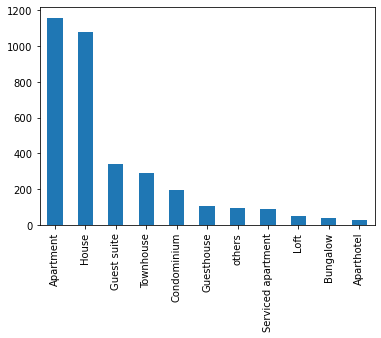

In [13]:
df['property_type'].value_counts().plot(kind='bar')
plt.xticks(rotation=90)

In [14]:
df['host_response_time'].unique()

array(['within an hour', 'within a few hours', 'within a day',
       'a few days or more'], dtype=object)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'within an hour'),
  Text(1, 0, 'within a few hours'),
  Text(2, 0, 'within a day'),
  Text(3, 0, 'a few days or more')])

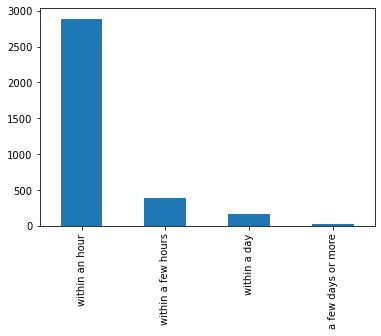

In [15]:
df['host_response_time'].value_counts().plot(kind='bar')
plt.xticks(rotation=90)

In [16]:
df['cancellation_policy'].unique()

array(['strict', 'moderate', 'flexible', 'strict_14_with_grace_period',
       'super_strict_60', 'super_strict_30'], dtype=object)

In [17]:
df['host_response_rate'].unique()

array([ 99., 100.,  90.,  75.,  86.,  92.,  70.,  98.,  67.,  91.,  84.,
         0.,  80.,  56.,  85.,  50.,  57.,  71.,  93.,  97.,  95.,  96.,
        88.,  78.,  40.,  94.,  83.,  89.,  33.,  60.,  87.,  62.])

In [18]:
df['neighbourhood_group_cleansed'].unique()

array(['Downtown', 'Queen Anne', 'Rainier Valley', 'Central Area',
       'Beacon Hill', 'Magnolia', 'Other neighborhoods', 'Northgate',
       'Cascade', 'University District', 'West Seattle', 'Capitol Hill',
       'Lake City', 'Ballard', 'Delridge', 'Seward Park', 'Interbay'],
      dtype=object)

In [19]:
df['room_type'].unique()

array(['Entire home/apt', 'Private room', 'Shared room'], dtype=object)

In [20]:
df['bed_type'].unique()

array(['Real Bed', 'Futon', 'Pull-out Sofa', 'Airbed'], dtype=object)

In [21]:
df['property_type'].unique()

array(['Apartment', 'House', 'Guest suite', 'Townhouse', 'Bungalow',
       'Condominium', 'Loft', 'Serviced apartment', 'Guesthouse',
       'others', 'Aparthotel'], dtype=object)

In [22]:
data = df.copy()

In [23]:
data.head()

,X1,id,host_is_superhost,host_response_rate,host_response_time,host_listings_count,host_identity_verified,accommodates,neighbourhood_group_cleansed,property_type,...,bedrooms,beds,bed_type,amenities,cleaning_fee,minimum_nights,maximum_nights,instant_bookable,cancellation_policy,price
0,5460,22146017,False,99.0,within an hour,521,False,5,Downtown,Apartment,...,2,2,Real Bed,"{TV,Internet,Wifi,Kitchen,Elevator,Heating,""Fa...",129.0,2,1125,True,strict,279.0
1,4143,18638163,True,100.0,within an hour,1,True,2,Queen Anne,House,...,0,1,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",50.0,2,30,True,moderate,99.0
2,5802,22734110,True,100.0,within an hour,1,False,4,Rainier Valley,Guest suite,...,1,2,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Free stre...",25.0,2,28,False,moderate,75.0
3,776,3946674,True,90.0,within a few hours,1,True,2,Central Area,House,...,1,1,Real Bed,"{Internet,Wifi,Kitchen,""Pets live on this prop...",0.0,2,30,False,flexible,70.0
4,6064,23610186,True,100.0,within an hour,4,True,8,Beacon Hill,House,...,3,3,Real Bed,"{TV,Wifi,Kitchen,""Free parking on premises"",""S...",99.0,2,12,False,flexible,242.0


### Creating dummies for catergorical columns

In [24]:
host_response_time_dummies = pd.get_dummies(data.host_response_time)
data = pd.concat([data, host_response_time_dummies], axis = 'columns')
data = data.drop(['host_response_time'], axis = 'columns')

In [25]:
data.head()

,X1,id,host_is_superhost,host_response_rate,host_listings_count,host_identity_verified,accommodates,neighbourhood_group_cleansed,property_type,room_type,...,cleaning_fee,minimum_nights,maximum_nights,instant_bookable,cancellation_policy,price,a few days or more,within a day,within a few hours,within an hour
0,5460,22146017,False,99.0,521,False,5,Downtown,Apartment,Entire home/apt,...,129.0,2,1125,True,strict,279.0,0,0,0,1
1,4143,18638163,True,100.0,1,True,2,Queen Anne,House,Entire home/apt,...,50.0,2,30,True,moderate,99.0,0,0,0,1
2,5802,22734110,True,100.0,1,False,4,Rainier Valley,Guest suite,Entire home/apt,...,25.0,2,28,False,moderate,75.0,0,0,0,1
3,776,3946674,True,90.0,1,True,2,Central Area,House,Private room,...,0.0,2,30,False,flexible,70.0,0,0,1,0
4,6064,23610186,True,100.0,4,True,8,Beacon Hill,House,Entire home/apt,...,99.0,2,12,False,flexible,242.0,0,0,0,1


In [26]:
data['host_is_superhost'] = data['host_is_superhost'].replace({True: 1, False: 0}).astype(float)
data['host_identity_verified'] = data['host_identity_verified'].replace({True: 1, False: 0}).astype(float)

In [27]:
cancellation_policy_dummies = pd.get_dummies(data.cancellation_policy)
data = pd.concat([data, cancellation_policy_dummies], axis = 'columns')
data = data.drop(['cancellation_policy'], axis = 'columns')

In [28]:
property_type_dummies = pd.get_dummies(data.property_type)
data = pd.concat([data, property_type_dummies], axis = 'columns')
data = data.drop(['property_type'], axis = 'columns')

In [29]:
bed_type_dummies = pd.get_dummies(data.bed_type)
data = pd.concat([data, bed_type_dummies], axis = 'columns')
data = data.drop(['bed_type'], axis = 'columns')

In [30]:
room_type_dummies = pd.get_dummies(data.room_type)
data = pd.concat([data, room_type_dummies], axis = 'columns')
data = data.drop(['room_type'], axis = 'columns')

In [31]:
neighbourhood_group_cleansed_dummies = pd.get_dummies(data.neighbourhood_group_cleansed)
data = pd.concat([data, neighbourhood_group_cleansed_dummies], axis = 'columns')
data = data.drop(['neighbourhood_group_cleansed'], axis = 'columns')

In [32]:
# Removing amenities as creating seperate column for amenities will create lot of dummy columns, which is not good, nor required
data = data.drop(['amenities'], axis = 'columns')

In [33]:
data = data.drop(['X1'], axis = 'columns')
data = data.drop(['id'], axis = 'columns')

### Finding if there are still any catergorical columns

In [34]:
cols = data.columns
num_cols = data._get_numeric_data().columns
cat_cols = list(set(cols) - set(num_cols))
cat_cols

[]

In [35]:
data.shape

(3466, 61)

## Training and predicting

In [36]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score 
from sklearn.metrics import mean_squared_error

In [37]:
X = data.drop(['price'], axis = 'columns')
y = data['price']

### Splitting the data 40-60 for train and validation datase. This is done for faster training and finding the right algorithm

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=100)

In [39]:
X_train

,host_is_superhost,host_response_rate,host_listings_count,host_identity_verified,accommodates,latitude,longitude,guests_included,bathrooms,bedrooms,...,Interbay,Lake City,Magnolia,Northgate,Other neighborhoods,Queen Anne,Rainier Valley,Seward Park,University District,West Seattle
3112,0.0,100.0,1,0.0,2,47.604189,-122.304038,1,1.0,1,...,0,0,0,0,0,0,0,0,0,0
2798,0.0,100.0,1,0.0,8,47.650110,-122.374916,1,3.5,3,...,0,0,0,0,0,1,0,0,0,0
2021,1.0,89.0,1,0.0,4,47.623512,-122.325941,1,1.0,1,...,0,0,0,0,0,0,0,0,0,0
581,0.0,100.0,123,0.0,2,47.616229,-122.314903,1,1.5,1,...,0,0,0,0,0,0,0,0,0,0
1752,0.0,100.0,1,1.0,2,47.661934,-122.349068,1,1.0,1,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1930,0.0,100.0,57,1.0,1,47.650024,-122.332803,1,3.5,1,...,0,0,0,0,1,0,0,0,0,0
79,1.0,100.0,1,1.0,5,47.685154,-122.354178,4,1.0,2,...,0,0,0,0,1,0,0,0,0,0
1859,1.0,100.0,3,1.0,2,47.664401,-122.348503,2,1.0,0,...,0,0,0,0,1,0,0,0,0,0
2840,0.0,100.0,161,0.0,6,47.664100,-122.359348,6,2.0,3,...,0,0,0,0,1,0,0,0,0,0


### Training with RandomForestRegressor

In [40]:
regr = RandomForestRegressor(max_depth=4, random_state=0)
regr.fit(X_train, y_train)

RandomForestRegressor(max_depth=4, random_state=0)

In [41]:
y_pred = regr.predict(X_test)
r2 = r2_score(y_test, y_pred) 
rmse = mean_squared_error(y_test, y_pred)
print("r2 score on validation dataset is ", r2 )
print("rmse score on validation dataset is ", rmse )

r2 score on validation dataset is  0.6421617104839032
rmse score on validation dataset is  8906.542413968009


In [42]:
y_pred_train = regr.predict(X_train)
r2 = r2_score(y_train, y_pred_train) 
rmse = mean_squared_error(y_train, y_pred_train)
print("r2 score on train dataset is ", r2 )
print("rmse score on train dataset is ", rmse )

r2 score on train dataset is  0.7996945711827281
rmse score on train dataset is  5131.162543483818


### Let's keep this random forest as a base model for building further models

### Training using CatBoostRegressor

In [47]:
cat1 = CatBoostRegressor()
parameters = {
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [2, 3, 5, 6],
              'n_estimators':  [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]}

cat_grid = GridSearchCV(cat1,
                        parameters,
                        cv = 3,
                        n_jobs = 5,
                        verbose=True)

cat_grid.fit(X_train,
         y_train)

print(cat_grid.best_score_)
print(cat_grid.best_params_)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  70 tasks      | elapsed:    3.2s
[Parallel(n_jobs=5)]: Done 300 tasks      | elapsed:   21.9s
[Parallel(n_jobs=5)]: Done 360 out of 360 | elapsed:   29.1s finished


0:	learn: 153.2187204	total: 2.44ms	remaining: 241ms
1:	learn: 146.8164211	total: 4.25ms	remaining: 208ms
2:	learn: 140.5288391	total: 6.05ms	remaining: 196ms
3:	learn: 134.8064881	total: 7.85ms	remaining: 188ms
4:	learn: 129.5652104	total: 9.66ms	remaining: 183ms
5:	learn: 124.7902976	total: 11.5ms	remaining: 181ms
6:	learn: 120.9673915	total: 13.4ms	remaining: 178ms
7:	learn: 116.9332043	total: 15.2ms	remaining: 175ms
8:	learn: 113.1970490	total: 17.1ms	remaining: 172ms
9:	learn: 109.8285465	total: 18.9ms	remaining: 171ms
10:	learn: 106.6591754	total: 20.8ms	remaining: 168ms
11:	learn: 103.6750730	total: 22.7ms	remaining: 167ms
12:	learn: 101.0005746	total: 24.6ms	remaining: 165ms
13:	learn: 98.6006273	total: 26.5ms	remaining: 163ms
14:	learn: 96.3056975	total: 28.5ms	remaining: 161ms
15:	learn: 94.0520676	total: 30.4ms	remaining: 159ms
16:	learn: 92.2301206	total: 32.3ms	remaining: 158ms
17:	learn: 90.4511324	total: 34.2ms	remaining: 156ms
18:	learn: 88.7383315	total: 36ms	remaining

In [48]:
best_cat_grid=cat_grid.best_estimator_
y_pred=best_cat_grid.predict(X_test)
r2 = r2_score(y_test, y_pred) 
rmse = mean_squared_error(y_test, y_pred)
print("r2 score on validation dataset is ", r2 )
print("rmse score on validation dataset is ", rmse )

r2 score on validation dataset is  0.694748238048394
rmse score on validation dataset is  7597.671474556236


In [49]:
y_pred=best_cat_grid.predict(X_train)
r2 = r2_score(y_train, y_pred) 
rmse = mean_squared_error(y_train, y_pred)
print("r2 score on train dataset is ", r2 )
print("rmse score on train dataset is ", rmse )

r2 score on train dataset is  0.8655566526115728
rmse score on train dataset is  3443.993866833211


### Again training using RandomForest with better parameters

In [50]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 100, stop = 500, num = 10)]
max_depth = [int(x) for x in np.linspace(1, 100,10)]
min_samples_split = [2, 5, 10,14]
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
print(random_grid)

{'n_estimators': [100, 144, 188, 233, 277, 322, 366, 411, 455, 500], 'max_depth': [1, 12, 23, 34, 45, 56, 67, 78, 89, 100], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8]}


In [51]:
rf=RandomForestRegressor()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.4min finished


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'max_depth': [1, 12, 23, 34, 45, 56, 67,
                                                      78, 89, 100],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [100, 144, 188, 233,
                                                         277, 322, 366, 411,
                                                         455, 500]},
                   random_state=100, verbose=2)

In [52]:
best_random_grid=rf_randomcv.best_estimator_
y_pred=best_random_grid.predict(X_test)
r2 = r2_score(y_test, y_pred) 
rmse = mean_squared_error(y_test, y_pred)
print("r2 score on validation dataset is ", r2 )
print("rmse score on validation dataset is ", rmse )

r2 score on validation dataset is  0.7046892868998578
rmse score on validation dataset is  7350.240230251377


In [53]:
y_pred=best_random_grid.predict(X_train)
r2 = r2_score(y_train, y_pred) 
rmse = mean_squared_error(y_train, y_pred)
print("r2 score on test dataset is ", r2 )
print("rmse score on train dataset is ", rmse )

r2 score on test dataset is  0.9333189028186403
rmse score on train dataset is  1708.1491512021082


### This is a case of overfitting as there is a significant difference between train and test in r2 score


In [54]:
xgb1 = xgb.XGBRegressor()
parameters = {'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [2, 3, 5, 6, 7],
              'min_child_weight': [4],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators':  [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 3,
                        n_jobs = 5,
                        verbose=True)

xgb_grid.fit(X_train,
         y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 3 folds for each of 150 candidates, totalling 450 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:   10.8s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:  1.4min
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:  3.7min
[Parallel(n_jobs=5)]: Done 450 out of 450 | elapsed:  3.9min finished


[10:58:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
0.7805884809461214
{'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'objective': 'reg:linear', 'subsample': 0.7}


In [55]:
best_xgb_grid=xgb_grid.best_estimator_

In [56]:
y_pred=best_xgb_grid.predict(X_test)
r2 = r2_score(y_test, y_pred) 
rmse = mean_squared_error(y_test, y_pred)
print("r2 score on validation dataset is ", r2 )
print("rmse score on validation dataset is ", rmse )

r2 score on validation dataset is  0.7002347567608076
rmse score on validation dataset is  7461.112830473678


In [57]:
y_pred=best_xgb_grid.predict(X_train)
r2 = r2_score(y_train, y_pred) 
rmse = mean_squared_error(y_train, y_pred)
print("r2 score on train dataset is ", r2 )
print("rmse score on train dataset is ", rmse )

r2 score on train dataset is  0.9100447427710825
rmse score on train dataset is  2304.3561485472464


### This is also a case of overfitting

## Using catboost for final training as it does not overfit as compared to others 

In [58]:
## Training data with 30% split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)

In [59]:
cat1 = CatBoostRegressor()
parameters = {
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [2, 3, 5, 6],
              'n_estimators':  [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]}

cat_grid = GridSearchCV(cat1,
                        parameters,
                        cv = 3,
                        n_jobs = 5,
                        verbose=True)

cat_grid.fit(X_train,
         y_train)

print(cat_grid.best_score_)
print(cat_grid.best_params_)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    3.9s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:   25.8s
[Parallel(n_jobs=5)]: Done 360 out of 360 | elapsed:   52.7s finished


0:	learn: 150.5468106	total: 2.99ms	remaining: 296ms
1:	learn: 144.6735005	total: 5.65ms	remaining: 277ms
2:	learn: 139.3505988	total: 8.47ms	remaining: 274ms
3:	learn: 134.4705608	total: 11.2ms	remaining: 268ms
4:	learn: 129.9761533	total: 14ms	remaining: 266ms
5:	learn: 125.7479449	total: 16.8ms	remaining: 264ms
6:	learn: 122.2002203	total: 19.7ms	remaining: 261ms
7:	learn: 118.8110943	total: 22.5ms	remaining: 259ms
8:	learn: 115.7470141	total: 25.4ms	remaining: 257ms
9:	learn: 112.9200840	total: 28.3ms	remaining: 255ms
10:	learn: 110.1642488	total: 31.3ms	remaining: 253ms
11:	learn: 107.4693726	total: 34.4ms	remaining: 252ms
12:	learn: 105.3149011	total: 37.3ms	remaining: 249ms
13:	learn: 103.2990878	total: 40.2ms	remaining: 247ms
14:	learn: 101.4177204	total: 43.1ms	remaining: 244ms
15:	learn: 99.6119926	total: 46.1ms	remaining: 242ms
16:	learn: 97.8362878	total: 48.8ms	remaining: 238ms
17:	learn: 96.2913016	total: 51.5ms	remaining: 235ms
18:	learn: 94.6547113	total: 54.3ms	remaini

In [60]:
best_grid=cat_grid.best_estimator_
y_pred=best_grid.predict(X_test)
r2 = r2_score(y_test, y_pred) 
rmse = mean_squared_error(y_test, y_pred)
print("r2 score on validation dataset is ", r2 )
print("rmse score on validation dataset is ", rmse )

r2 score on validation dataset is  0.7471290776380937
rmse score on validation dataset is  6708.3775739874545


In [61]:
y_pred=best_grid.predict(X_train)
r2 = r2_score(y_train, y_pred) 
rmse = mean_squared_error(y_train, y_pred)
print("r2 score on train dataset is ", r2 )
print("rmse score on train dataset is ", rmse )

r2 score on train dataset is  0.8168100096368309
rmse score on train dataset is  4508.849484500909


In [62]:
# xgb1 = xgb.XGBRegressor()
# parameters = {'objective':['reg:linear'],
#               'learning_rate': [.03, 0.05, .07], #so called `eta` value
#               'max_depth': [2, 3, 5, 6, 7],
#               'min_child_weight': [4],
#               'subsample': [0.7],
#               'colsample_bytree': [0.7],
#               'n_estimators':  [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]}

# xgb_grid = GridSearchCV(xgb1,
#                         parameters,
#                         cv = 3,
#                         n_jobs = 5,
#                         verbose=True)

# xgb_grid.fit(X_train,
#          y_train)

# print(xgb_grid.best_score_)
# print(xgb_grid.best_params_)
# best_xgb_grid=xgb_grid.best_estimator_
# y_pred=best_xgb_grid.predict(X_test)
# r2 = r2_score(y_test, y_pred) 
# rmse = mean_squared_error(y_test, y_pred)
# print("r2 score on validation dataset is ", r2 )
# print("rmse score on validation dataset is ", rmse )
# y_pred=best_xgb_grid.predict(X_train)
# r2 = r2_score(y_train, y_pred) 
# rmse = mean_squared_error(y_train, y_pred)
# print("r2 score on train dataset is ", r2 )
# print("rmse score on train dataset is ", rmse )

### Prediction on test data

In [63]:
best_test_grid = best_grid

In [64]:
df_test = pd.read_csv('price_test.csv')
df_test.head()

,X1,id,host_is_superhost,host_response_rate,host_response_time,host_listings_count,host_identity_verified,accommodates,neighbourhood_group_cleansed,property_type,...,bathrooms,bedrooms,beds,bed_type,amenities,cleaning_fee,minimum_nights,maximum_nights,instant_bookable,cancellation_policy
0,130,392779,False,90%,within an hour,1,True,4,Beacon Hill,Guest suite,...,1.0,2,2,Real Bed,"{TV,Internet,Wifi,Kitchen,""Free street parking...",$85.00,3,300,True,moderate
1,2425,12456183,True,86%,within a day,1,False,4,Lake City,Guest suite,...,1.0,1,2,Real Bed,"{TV,Wifi,""Free parking on premises"",""Pets allo...",$40.00,2,1125,True,moderate
2,432,1851863,True,100%,within an hour,1,True,2,Northgate,Apartment,...,1.0,1,1,Real Bed,"{Wifi,Kitchen,""Free parking on premises"",Heati...",$150.00,5,120,False,strict_14_with_grace_period
3,5994,23309878,True,100%,within an hour,2,True,2,Downtown,Apartment,...,1.0,1,1,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",$75.00,1,30,False,strict_14_with_grace_period
4,2110,10768347,False,100%,within an hour,1,False,2,Other neighborhoods,House,...,1.0,1,1,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",0,1,3,False,flexible


### Applying the same preprocessing as train data

In [65]:
df_test['host_response_rate'] = df_test['host_response_rate'].apply(lambda x: x.replace('%', '')).astype(float)
df_test['cleaning_fee'] = df_test['cleaning_fee'].apply(lambda x: x.replace('$', '')).astype(float)

In [66]:
property_type_low_freq = ['Houseboat', 'Bed and breakfast', 'Camper/RV','Tiny house', 'Cabin', 'Boat', 'Cottage', 'Other', 'Farm stay','Hostel', 'Tent', 'Resort', 'Yurt', 'In-law', 'Boutique hotel', 'Villa' ]
df_test['property_type'] = df_test['property_type'].apply(lambda x: 'others' if x in property_type_low_freq else x)

In [67]:
host_response_time_dummies = pd.get_dummies(df_test.host_response_time)
df_test = pd.concat([df_test, host_response_time_dummies], axis = 'columns')
df_test = df_test.drop(['host_response_time'], axis = 'columns')

df_test['host_is_superhost'] = df_test['host_is_superhost'].replace({True: 1, False: 0}).astype(float)
df_test['host_identity_verified'] = df_test['host_identity_verified'].replace({True: 1, False: 0}).astype(float)

cancellation_policy_dummies = pd.get_dummies(df_test.cancellation_policy)
df_test = pd.concat([df_test, cancellation_policy_dummies], axis = 'columns')
df_test = df_test.drop(['cancellation_policy'], axis = 'columns')

property_type_dummies = pd.get_dummies(df_test.property_type)
df_test = pd.concat([df_test, property_type_dummies], axis = 'columns')
df_test = df_test.drop(['property_type'], axis = 'columns')

bed_type_dummies = pd.get_dummies(df_test.bed_type)
df_test = pd.concat([df_test, bed_type_dummies], axis = 'columns')
df_test = df_test.drop(['bed_type'], axis = 'columns')

room_type_dummies = pd.get_dummies(df_test.room_type)
df_test = pd.concat([df_test, room_type_dummies], axis = 'columns')
df_test = df_test.drop(['room_type'], axis = 'columns')

neighbourhood_group_cleansed_dummies = pd.get_dummies(df_test.neighbourhood_group_cleansed)
df_test = pd.concat([df_test, neighbourhood_group_cleansed_dummies], axis = 'columns')
df_test = df_test.drop(['neighbourhood_group_cleansed'], axis = 'columns')

df_test = df_test.drop(['amenities'], axis = 'columns')

df_test = df_test.drop(['X1'], axis = 'columns')
df_test = df_test.drop(['id'], axis = 'columns')

In [68]:
y_test_pred=best_grid.predict(df_test)

In [69]:
y_test_pred

array([142.0726582 ,  95.26754977, 151.38961345, ...,  68.22632796,
       129.66255331, 223.29487467])